In [22]:
import os 
import math
import numpy as np
import pandas as pd 
import cv2
import tensorflow as tf 
import tensorflow.keras as tfk 
from tensorflow.keras import layers as tfkl 
import tensorflow.keras.applications as tfka
from tensorflow.keras.backend import epsilon
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
from sklearn.model_selection import train_test_split

In [23]:
images_path = '/kaggle/input/lung-cancer/lung_dataset_interpolated.npz'
bboxes_path = '/kaggle/input/segmented-lung-cancer/bounding_boxes_new.npz'

In [24]:
def load_images(images_path=images_path): 
    data = np.load(images_path)
    slices = data['full_slices']
    labels = data['tumor_classes']

    return slices, labels

def load_bboxes(bboxes_path=bboxes_path):
    data = np.load(bboxes_path)
    return data['bounding_boxes']

In [25]:
full_slices, labels = load_images()
bboxes = load_bboxes()

In [26]:
print(full_slices.shape, labels.shape)
print(bboxes.shape)

(2363, 512, 512) (2363,)
(2363, 4)


In [27]:
def scale_images(images):
    min_vals = images.min(axis=(1, 2), keepdims=True)  # Min per image
    max_vals = images.max(axis=(1, 2), keepdims=True)  # Max per image
    
    range_vals = max_vals - min_vals
    range_vals[range_vals == 0] = 1  
    
    return (images - min_vals) / range_vals

In [28]:
def rescale_images_255_uint8(images):
    images *= 255
    return np.array(images).astype('uint8')

In [29]:
def apply_median_blur(images): 
    return [cv2.medianBlur(image, 3) for image in images]

In [30]:
def apply_hist_equalization(images):
    return [cv2.equalizeHist(image) for image in images]

In [31]:
def apply_clahe(images):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return [clahe.apply(image) for image in images]

In [32]:
def apply_open_morph(images):
    kernel = np.ones((3, 3), np.uint8)
    return [cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel) for image in images]

In [33]:
def expand_channels(images, channels=3): 
    return np.stack([images] * 3, axis=-1)

In [34]:
def preprocess_images(images, steps): 
    for step in steps:
        images = step(images)
    return np.array(images)

In [35]:
preprocessing_pipeline = [
    scale_images,
    rescale_images_255_uint8,
    apply_median_blur,
    apply_hist_equalization,
    apply_clahe,
    apply_open_morph,
    expand_channels,
]

In [36]:
full_slices = preprocess_images(full_slices, preprocessing_pipeline)

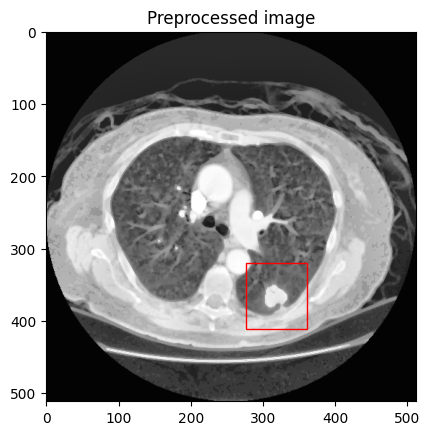

In [37]:
index = 0
box = bboxes[index]
fig, ax = plt.subplots()
ax.imshow(full_slices[index], cmap='gray')
plt.title('Preprocessed image')
rect = Rectangle((box[0], box[1]), box[2], box[3], edgecolor='r', facecolor='none') 
ax.add_patch(rect)
plt.show()

In [38]:
def preprocess_bbox(bbox, shape):
    width, height = shape[:2]
    x, y, w, h = bbox
    x1, y1, x2, y2 = [x, y, x+w, y+h]
    x1 /= width
    x2 /= width
    y1 /= height
    y2 /= height
    bbox = np.array([x1, y1, x2, y2])
    return bbox

In [39]:
def unprocess_bbox(bbox, shape):
    width, height = shape[:2]
    x1, y1, x2, y2 = bbox
    x1 *= width
    x2 *= width
    y1 *= height
    y2 *= height
    bbox = np.array([x1, y1, x2 - x1, y2 - y1])
    return bbox

In [40]:
print(bboxes[:10])
print(np.array(bboxes[:10]).shape)

[[277 320  84  92]
 [304 314  90  85]
 [330 311  74  76]
 [324 313  85  80]
 [279 172  59  53]
 [192 189  59  60]
 [116 298  51  51]
 [102 373  50  50]
 [286 381  54  54]
 [382 353  51  49]]
(10, 4)


In [41]:
bboxes_new = []
for i in range(len(bboxes)): 
    bboxes_new.append(preprocess_bbox(bboxes[i], full_slices[0].shape))
bboxes = bboxes_new
del bboxes_new

In [42]:
print(bboxes[:10])
print(np.array(bboxes[:10]).shape)

[array([0.54101562, 0.625     , 0.70507812, 0.8046875 ]), array([0.59375   , 0.61328125, 0.76953125, 0.77929688]), array([0.64453125, 0.60742188, 0.7890625 , 0.75585938]), array([0.6328125 , 0.61132812, 0.79882812, 0.76757812]), array([0.54492188, 0.3359375 , 0.66015625, 0.43945312]), array([0.375     , 0.36914062, 0.49023438, 0.48632812]), array([0.2265625 , 0.58203125, 0.32617188, 0.68164062]), array([0.19921875, 0.72851562, 0.296875  , 0.82617188]), array([0.55859375, 0.74414062, 0.6640625 , 0.84960938]), array([0.74609375, 0.68945312, 0.84570312, 0.78515625])]
(10, 4)


## Custom callbacks

In [43]:
BATCH_SIZE = 32
EPOCHS = 200
PATIENCE = 50
IMAGE_SHAPE = full_slices.shape[1:] 
ALPHA = 1.0
MULTI_PROCESSING = False
THREADS = 1

In [44]:
class DataGenerator(tfk.utils.Sequence):
    def __init__(self, images, labels, boxes): 
        self.images = images
        self.labels = labels
        self.boxes = boxes

    def __len__(self):
        return math.ceil(len(self.boxes) / BATCH_SIZE)

    def __getitem__(self, idx):
        batch_images = self.images[idx * BATCH_SIZE:(idx + 1) * BATCH_SIZE]
        # batch_labels = self.labels[idx * BATCH_SIZE:(idx + 1) * BATCH_SIZE]
        batch_boxes = self.boxes[idx * BATCH_SIZE:(idx + 1) * BATCH_SIZE]

        return np.array(batch_images), np.array(batch_boxes)

Credits: https://github.com/lars76/object-localization/blob/master/example_1/train.py

In [45]:
class Validation(tfk.callbacks.Callback): 
    def __init__(self, generator):
        self.generator = generator

    def on_epoch_end(self, epoch, logs): 
        mse = 0
        intersections = 0
        unions = 0

        for i in range(len(self.generator)): 
            images, gt = self.generator[i]
            prediction = self.model.predict_on_batch(images)
            mse += np.linalg.norm(gt - prediction, ord='fro') / prediction.shape[0]

            prediction = np.maximum(prediction, 0)

            diff_width = np.minimum(gt[:,0] + gt[:,2], prediction[:,0] + prediction[:,2]) - np.maximum(gt[:,0], prediction[:,0]) 
            diff_height = np.minimum(gt[:,1] + gt[:,3], prediction[:,1] + prediction[:,3]) - np.maximum(gt[:,1], prediction[:,1]) 
            intersection = np.maximum(diff_width, 0) * np.maximum(diff_height, 0)

            area_gt = gt[:,2] * gt[:,3]
            area_prediction = prediction[:,2] * prediction[:,3]
            union = np.maximum(area_gt + area_prediction - intersection, 0)

            intersections += np.sum(intersection * (union > 0))
            unions += np.sum(union)

            iou = np.round(intersections / (unions + epsilon()), 4)
            logs['val_iou'] = iou

            mse = np.round(mse, 4)
            logs['val_mse'] = mse

            print(" - val_iou: {} - val_mse: {}".format(iou, mse)) 

## Model

In [46]:
def build_model(input_shape=IMAGE_SHAPE, trainable=False): 
    model = tfka.MobileNetV2(input_shape=input_shape, include_top=False, alpha=ALPHA)
    model.trainable = trainable

    x = model.output
    # x = tfkl.Conv2D(64, kernel_size=1, activation='relu', name='reduce')(x)
    x = tfkl.Flatten()(x)
    x = tfkl.Dense(4, activation='relu', name='output')(x) # relu since bbox coords can't be negative

    return tfk.Model(inputs=model.input, outputs=x)

In [47]:
model = build_model()
# model.summary()

<ipython-input-46-d4dc72e20706>:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model = tfka.MobileNetV2(input_shape=input_shape, include_top=False, alpha=ALPHA)


In [48]:
preprocessed_X = tfka.mobilenet_v2.preprocess_input(full_slices)

In [49]:
X_train, X_val, y_train, y_val = train_test_split(preprocessed_X, bboxes, shuffle=True, test_size=0.2)

In [50]:
train_generator = DataGenerator(X_train, None, y_train)
# validation_generator = Validation(generator=DataGenerator(X_val, None, y_val))
validation_generator = DataGenerator(X_val, None, y_val)

In [51]:
model.compile(loss='mean_squared_error', optimizer='adamw', metrics=['accuracy', 'mse'])

In [52]:
checkpoint = tfk.callbacks.ModelCheckpoint(
    'model-{val_mse:.2f}.weights.h5', 
    monitor='val_mse',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min'
)

early_stop = tfk.callbacks.EarlyStopping(
    monitor='val_mse',
    patience=PATIENCE,
    mode='min'
)

reduce_lr = tfk.callbacks.ReduceLROnPlateau(
    monitor='val_mse',
    factor=0.2,
    patience=10,
    min_lr=1e-7,
    verbose=1,
    mode='min'
)

In [53]:
model_fit = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    # callbacks=[validation_generator, checkpoint, early_stop, reduce_lr],
    callbacks=[checkpoint, early_stop, reduce_lr],
    shuffle=True,
    verbose=1
)

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.1905 - loss: 1472.9702 - mse: 1472.9702
Epoch 1: val_mse improved from inf to 65.98729, saving model to model-65.99.weights.h5
60/60 ━━━━━━━━━━━━━━━━━━━━ 32s 339ms/step - accuracy: 0.1906 - loss: 1459.7104 - mse: 1459.7104 - val_accuracy: 0.1586 - val_loss: 65.9873 - val_mse: 65.9873 - learning_rate: 0.0010
Epoch 2/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.1774 - loss: 435.8227 - mse: 435.8227
Epoch 2: val_mse did not improve from 65.98729
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - accuracy: 0.1775 - loss: 436.7231 - mse: 436.7231 - val_accuracy: 0.1924 - val_loss: 343.9488 - val_mse: 343.9488 - learning_rate: 0.0010
Epoch 3/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.2396 - loss: 1193.6665 - mse: 1193.6665
Epoch 3: val_mse did not improve from 65.98729
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - accuracy: 0.2394 - loss: 1193.2047 - mse: 1193.2047 - val_accuracy: 0.1839 - val_loss: 471.6227 - val_ms

In [54]:
from datetime import datetime

time_now = datetime.now().strftime('%Y-%m-%d_%H-%M-%S') 
model.save(f'/kaggle/working/localization_mse_{time_now}.keras')

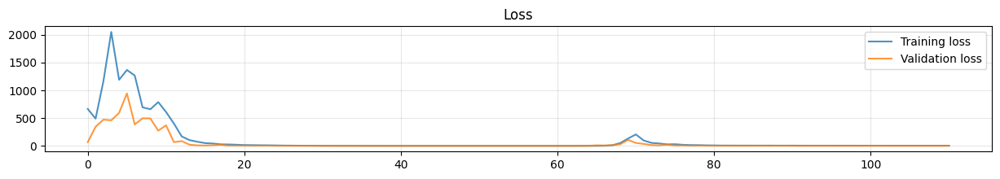

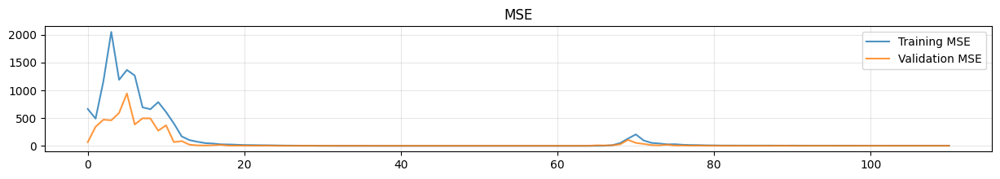

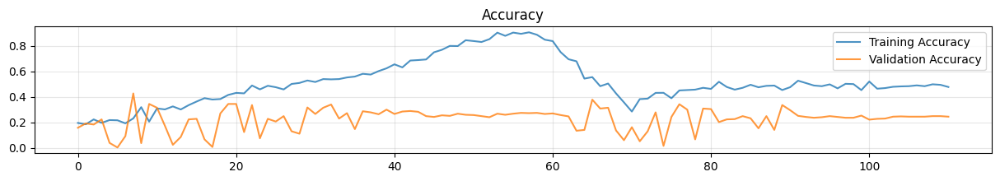

In [55]:
history = model_fit.history 
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

plt.figure(figsize=(15, 2))
plt.plot(history['mse'], label='Training MSE', alpha=.8)
plt.plot(history['val_mse'], label='Validation MSE', alpha=.8)
plt.title('MSE')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training Accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation Accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [56]:
# del model

In [57]:
# model = tf.keras.models.load_model('/kaggle/working/localization_2025-02-04_18-02-51.keras')

In [58]:
train_preds = model.predict(full_slices)

74/74 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step


In [59]:
print(train_preds[:10])

[[ 0.9133244   1.2970701   1.3102258  -0.14527608]
 [ 0.683872    2.0404396   0.24755919  1.2907857 ]
 [ 2.0062678   2.23284    -0.52075094 -0.50372434]
 [ 0.56404006  0.80168283  1.6362543   0.9774989 ]
 [ 0.81719565 -0.39285818  1.0155202   0.15088075]
 [ 1.4637523  -0.89713913  1.4029262  -0.6455034 ]
 [ 0.75237554  2.2283416   1.2472913   1.2726116 ]
 [ 0.15876715  3.8023298   1.4431655   1.2599533 ]
 [ 1.230795    2.907749    1.4544978   0.30473363]
 [ 0.4915765   1.865659    2.5474412   0.8936145 ]]


In [60]:
train_preds = np.array([unprocess_bbox(bbox, full_slices[0].shape) for bbox in train_preds]).astype('uint8')
bboxes = np.array([unprocess_bbox(bbox, full_slices[0].shape) for bbox in bboxes]).astype('uint8')

/usr/local/lib/python3.10/dist-packages/matplotlib/patches.py:738: RuntimeWarning: overflow encountered in scalar add
  x1 = self.convert_xunits(self._x0 + self._width)


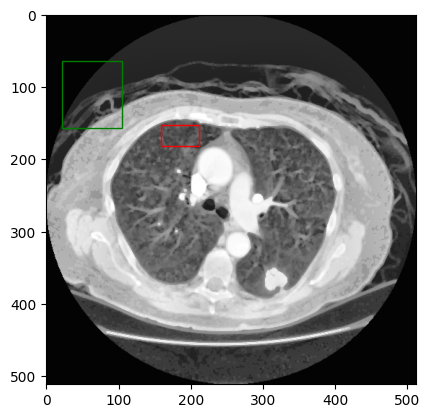

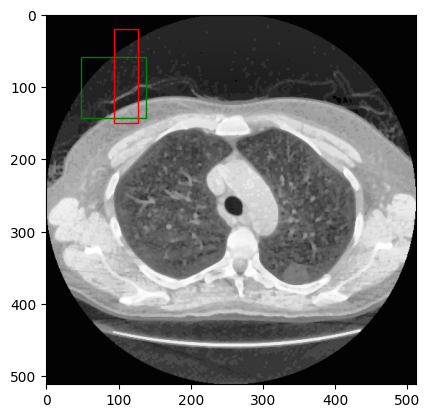

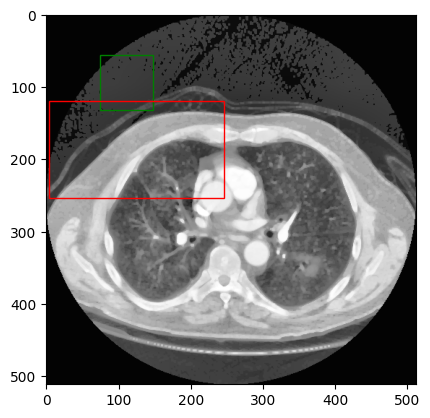

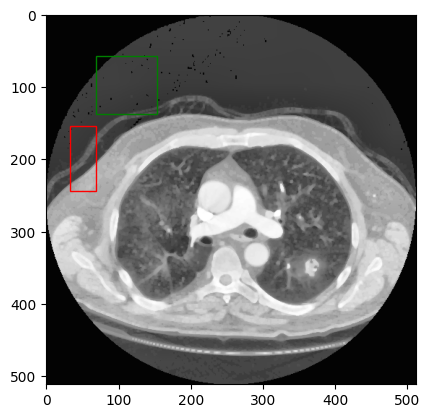

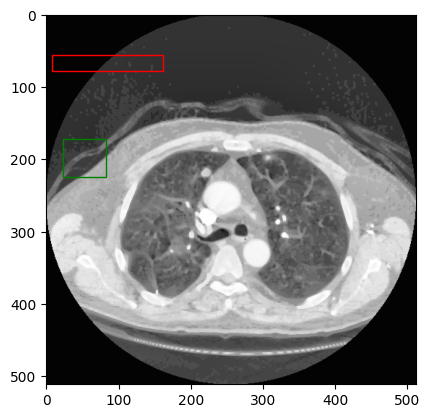

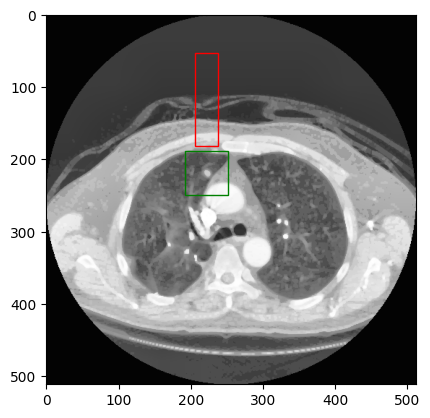

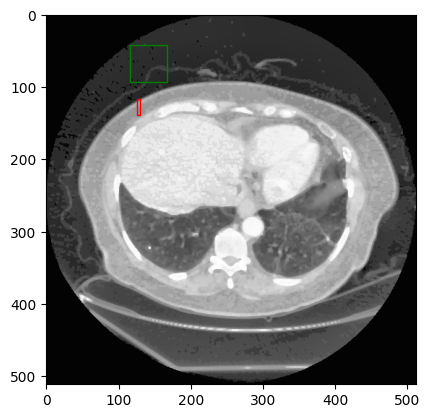

/usr/local/lib/python3.10/dist-packages/matplotlib/patches.py:739: RuntimeWarning: overflow encountered in scalar add
  y1 = self.convert_yunits(self._y0 + self._height)


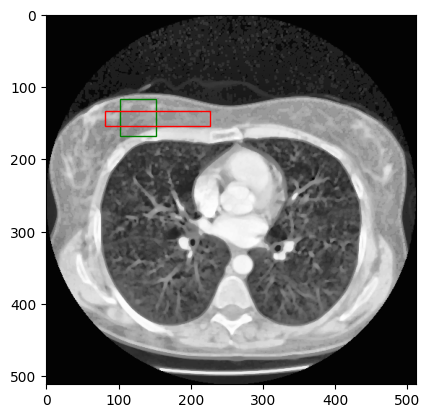

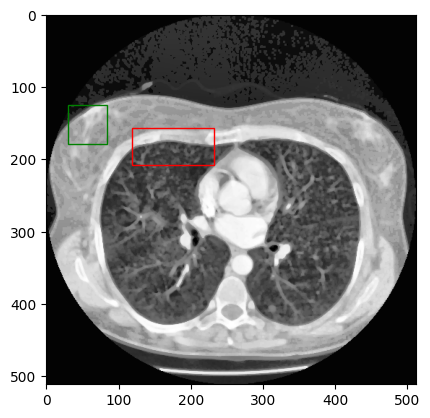

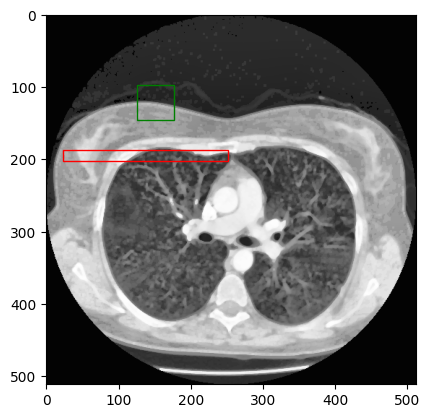

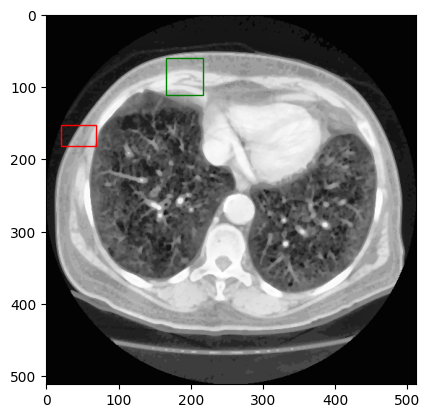

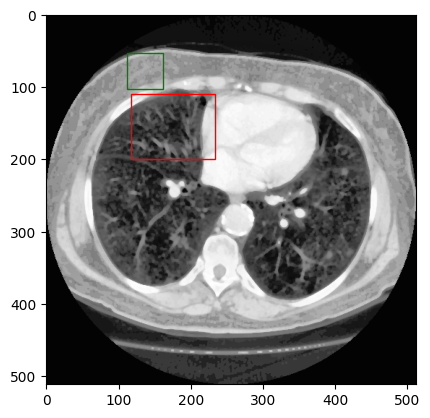

...

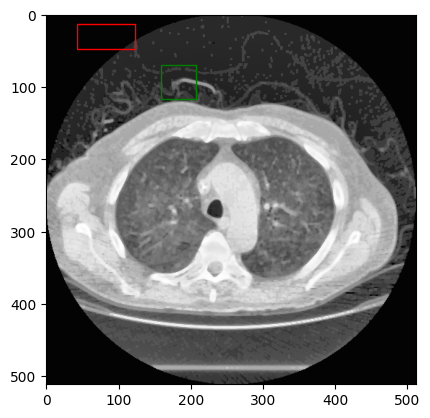

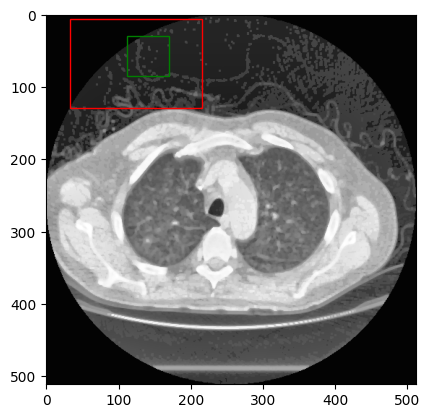

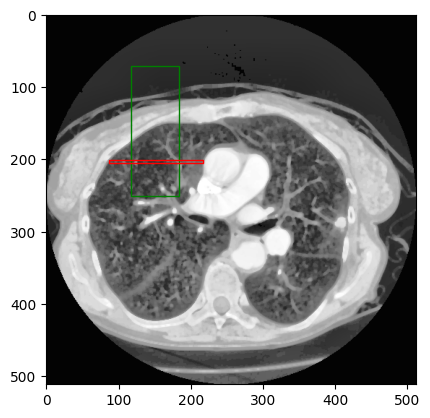

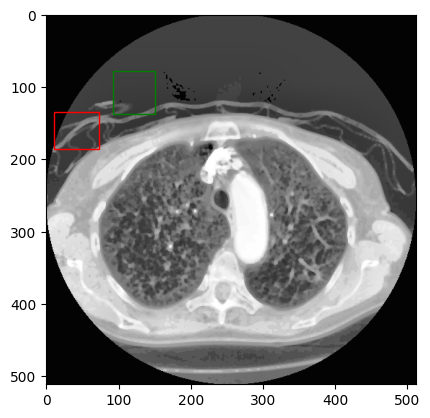

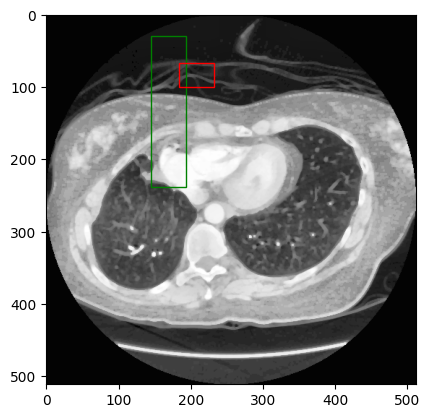

In [61]:
import random

# for i in random.sample(range(len(train_preds)), k=20): 
for i in range(100):
    fig, ax = plt.subplots()
    ax.imshow(full_slices[i], cmap='gray')
    rect_gt = Rectangle((bboxes[i,0], bboxes[i,1]), bboxes[i,2], bboxes[i,3], linewidth=1, facecolor='none', edgecolor='g')
    rect_pred = Rectangle((train_preds[i,0], train_preds[i,1]), train_preds[i,2], train_preds[i,3], linewidth=1, facecolor='none', edgecolor='r')
    ax.add_patch(rect_gt)
    ax.add_patch(rect_pred)
    plt.show()